# 4 Parts
1. Intro, Libraries, & Data
2. Resize Image Functions & Glance Analysis
3. (Optional) If time find optimal (median) x and y sizes of images.

# 1. Intro, Libraries, & Data.

In [8]:
# Importing Libraries

# Internal Python Functionality Libraries
import os

os.chdir('..')
print(os.getcwd())

from PIL import Image



# Repo Specific Libraries
from helpers.SetDataLocation import PathDir

# Data Analytics Libraries
import numpy as np
import pandas as pd

# Data Viz Libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Computer Vision Libraries
import cv2
import skimage
from PIL import Image

C:\Users\Charl\Documents\FinalProject\resized


In [9]:
os.chdir('..')
path_dir = PathDir()


path_to_dataset = "C:/Users/Charl/Documents/FinalProject"
# USE FORWARD SLASHES IF WINDOWS ///
path_dir.create_file(path_to_dataset)
path_dir.get_path_and_chdir()
os.chdir(os.getcwd() + '\\' + 'resized' + '\\' + 'resized' )

.artistdata already created. If need to change path, do so manually.


In [32]:
edgar_path = os.listdir()[2000]
edgar_img = Image.open(edgar_path)

# 2. Resize Image Functions

In [36]:
import numpy as np
from PIL import Image
from PIL import ImageFilter


def normal_padding(org_img, new_x: int, new_y: int):
    '''Apply padding on x and y axis to fill in the new_x and new_y dimensions'''
    width, height = org_img.size
    if width >= new_x and height >= new_y:
        return org_img

    padding_x = max(0, new_x - width)
    padding_y = max(0, new_y - height)
    padding_color = (0, 0, 0)  # Black padding color

    padded_img = Image.new("RGB", (new_x, new_y), padding_color)
    padded_img.paste(org_img, (padding_x // 2, padding_y // 2))

    return padded_img


def randomized_padding(org_img, new_x: int, new_y: int):
    '''Apply padding on x and y axis, placing the original image in a randomized spot in the padding.'''
    width, height = org_img.size
    if width >= new_x and height >= new_y:
        return org_img

    padding_x = max(0, new_x - width)
    padding_y = max(0, new_y - height)
    padding_color = (0, 0, 0)  # Black padding color

    padded_img = Image.new("RGB", (new_x, new_y), padding_color)

    x_offset = np.random.randint(0, padding_x + 1)
    y_offset = np.random.randint(0, padding_y + 1)
    padded_img.paste(org_img, (x_offset, y_offset))

    return padded_img


def image_resampling(org_img, new_x: int, new_y: int):
    '''Apply resampling of the image sampling the image outward or inward toward target x & y.'''
    return org_img.resize((new_x, new_y))


### OpenCV Variation
def image_resampling_cv2(org_img, new_x: int, new_y: int):
    '''Apply resampling of the image by sampling the image outward or inward toward target x & y.'''
    org_height, org_width = org_img.shape[:2]
    new_img = np.zeros((new_y, new_x, org_img.shape[2]), dtype=np.uint8)

    x_ratio = org_width / new_x
    y_ratio = org_height / new_y

    for y in range(new_y):
        for x in range(new_x):
            src_x = int(x * x_ratio)
            src_y = int(y * y_ratio)
            new_img[y, x] = org_img[src_y, src_x]

    return new_img

Reference Image

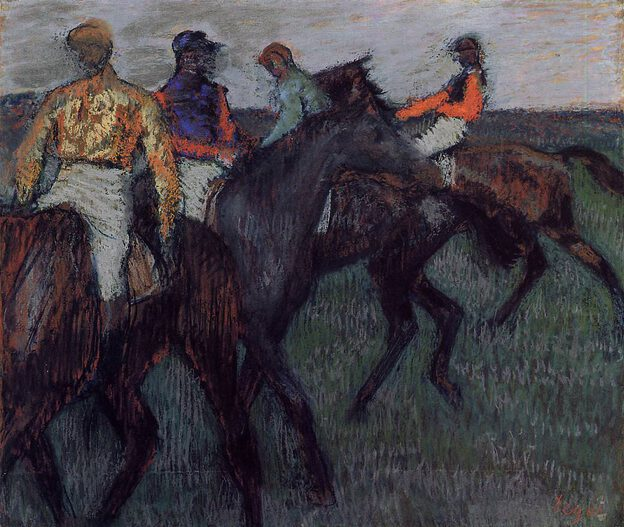

In [12]:
edgar_img

In [13]:
edgar_img.size

(624, 527)

##### Seam Carving

In [14]:
# Seam Carving Functions migth turn this into a class...
def seam_carving(org_img, new_x: int, new_y: int):
    '''Apply seam carving outward or inward to the target x or y.'''
    width, height = org_img.size
    if width == new_x and height == new_y:
        return org_img

    if width > new_x:
        num_seams = width - new_x
        carved_img = seam_carve_horizontal(org_img, num_seams)
    elif width < new_x:
        num_seams = new_x - width
        carved_img = seam_insert_horizontal(org_img, num_seams)
    else:
        carved_img = org_img

    if height > new_y:
        num_seams = height - new_y
        carved_img = seam_carve_vertical(carved_img, num_seams)
    elif height < new_y:
        num_seams = new_y - height
        carved_img = seam_insert_vertical(carved_img, num_seams)

    return carved_img

def compute_energy_map(image):
    '''Compute the energy map of the image using the gradient magnitude.'''
    grayscale_image = image.convert("L")
    gradient_x = np.array(grayscale_image.filter(ImageFilter.FIND_EDGES)).astype(np.int32).transpose()
    gradient_y = np.array(grayscale_image.transpose(Image.TRANSPOSE)).astype(np.int32)

    energy_map = np.sqrt(np.square(gradient_x) + np.square(gradient_y))
    return energy_map

def find_horizontal_seam(energy_map):
    '''Find the optimal horizontal seam using dynamic programming.'''
    height, width = energy_map.shape
    cumulative_energy = energy_map.copy()

    for row in range(1, height):
        cumulative_energy[row, 0] += min(cumulative_energy[row - 1, 0], cumulative_energy[row - 1, 1])
        cumulative_energy[row, width - 1] += min(cumulative_energy[row - 1, width - 1], cumulative_energy[row - 1, width - 2])

        for col in range(1, width - 1):
            cumulative_energy[row, col] += min(
                cumulative_energy[row - 1, col - 1],
                cumulative_energy[row - 1, col],
                cumulative_energy[row - 1, col + 1]
            )

    seam = []
    col = np.argmin(cumulative_energy[height - 1])
    seam.append((height - 1, col))

    for row in range(height - 2, -1, -1):
        if col == 0:
            min_col = np.argmin(cumulative_energy[row, col:col + 2])
            col += min_col
        elif col == width - 1:
            min_col = np.argmin(cumulative_energy[row, col - 1:col + 1])
            col += (min_col - 1)
        else:
            min_col = np.argmin(cumulative_energy[row, col - 1:col + 2])
            col += (min_col - 1)

        seam.append((row, col))

    return seam

def remove_horizontal_seam(image, seam):
    '''Remove the pixels along the given horizontal seam.'''
    width, height= image.size
    pixels = image.load()

    for row, col in seam:
        for i in range(col, width - 1):
            pixels[i, row] = pixels[i + 1, row]

    return image.crop

def seam_carve_horizontal(org_img, num_seams):
    '''Apply horizontal seam carving to reduce the width of the image by removing the given number of seams.'''
    image = org_img.copy()
    for _ in range(num_seams):
        energy_map = compute_energy_map(image)
        seam = find_horizontal_seam(energy_map)
        image = remove_horizontal_seam(image, seam)
    return image

def seam_insert_horizontal(org_img, num_seams):
    '''Apply horizontal seam insertion to increase the width of the image by inserting the given number of seams.'''
    image = org_img.copy()
    for _ in range(num_seams):
        energy_map = compute_energy_map(image)
        seam = find_horizontal_seam(energy_map)
        image = insert_horizontal_seam(image, seam)
    return image

def seam_carve_vertical(org_img, num_seams):
    '''Apply vertical seam carving to reduce the height of the image by removing the given number of seams.'''
    image = org_img.copy()
    for _ in range(num_seams):
        energy_map = compute_energy_map(image)
        seam = find_vertical_seam(energy_map)
        image = remove_vertical_seam(image, seam)
    return image

def seam_insert_vertical(org_img, num_seams):
    '''Apply vertical seam insertion to increase the height of the image by inserting the given number of seams.'''
    image = org_img.copy()
    for _ in range(num_seams):
        energy_map = compute_energy_map(image)
        seam = find_vertical_seam(energy_map)
        image = insert_vertical_seam(image, seam)
    return image

def find_vertical_seam(energy_map):
    '''Find the optimal vertical seam using dynamic programming.'''
    height, width = energy_map.shape
    cumulative_energy = energy_map.copy()

    for col in range(1, width):
        cumulative_energy[0, col] += min(cumulative_energy[0, col - 1], cumulative_energy[1, col - 1])

    for row in range(1, height - 1):
        for col in range(width):
            cumulative_energy[row, col] += min(
                cumulative_energy[row - 1, max(col - 1, 0)],
                cumulative_energy[row - 1, col],
                cumulative_energy[row - 1, min(col + 1, width - 1)]
            )

    seam = []
    row = np.argmin(cumulative_energy[height - 1])
    seam.append((row, height - 1))

    for col in range(height - 2, -1, -1):
        if row == 0:
            min_row = np.argmin(cumulative_energy[col, row:row + 2])
            row += min_row
        elif row == width - 1:
            min_row = np.argmin(cumulative_energy[col, row - 1:row + 1])
            row += (min_row - 1)
        else:
            min_row = np.argmin(cumulative_energy[col, row - 1:row + 2])
            row += (min_row - 1)

        seam.append((row, col))

    return seam

def remove_vertical_seam(image, seam):
    '''Remove the pixels along the given vertical seam.'''
    width, height = image.size
    pixels = image.load()

    new_image = Image.new(image.mode, (width - 1, height))
    new_pixels = new_image.load()

    for row, col in seam:
        for i in range(width):
            if i < col:
                new_pixels[i, row] = pixels[i, row]
            elif i > col:
                new_pixels[i - 1, row] = pixels[i, row]

    for row in range(height):
        for col in range(width - 1):
            if col < seam[row][1]:
                new_pixels[col, row] = pixels[col, row]
            else:
                new_pixels[col, row] = pixels[col + 1, row]

    return new_image

def insert_horizontal_seam(image, seam):
    '''Insert the pixels along the given horizontal seam.'''
    width, height = image.size
    pixels = image.load()

    new_image = Image.new(image.mode, (width, height + 1))
    new_pixels = new_image.load()

    for row, col in seam:
        for i in range(height):
            if i < row:
                new_pixels[col, i] = pixels[col, i]
            else:
                new_pixels[col, i + 1] = pixels[col, i]

    for col in range(width):
        if col < seam[0][1]:
            for i in range(height):
                new_pixels[col, i] = pixels[col, i]
        elif col > seam[-1][1]:
            for i in range(height):
                new_pixels[col, i] = pixels[col, i]

    return new_image

def insert_vertical_seam(image, seam):
    '''Insert the pixels along the given vertical seam.'''
    width, height = image.size
    pixels = image.load()

    new_image = Image.new(image.mode, (width + 1, height))
    new_pixels = new_image.load()

    for col, row in seam:
        for i in range(height):
            if i < row:
                new_pixels[col, i] = pixels[col, i]
            else:
                new_pixels[col, i] = pixels[col, i - 1]

    for row in range(height):
        for col in range(width):
            if col < seam[row][0]:
                new_pixels[col, row] = pixels[col, row]
            else:
                new_pixels[col + 1, row] = pixels[col, row]

    return new_image

In [28]:
edgar_img_path = os.getcwd() + "\\" + os.listdir()[2000]
albrecht_path = os.getcwd() + "\\" + os.listdir()[0]
edgar_img = Image.open(edgar_img_path)
albrecht_img = Image.open(albrecht_path)

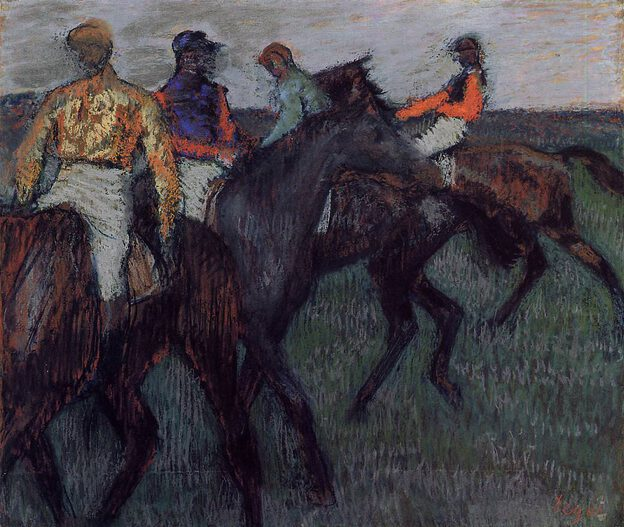

In [16]:
edgar_img

In [17]:
edgar_img.size

(624, 527)

C:\Users\Charl\AppData\Local\Temp\ipykernel_18176\1664061988.py:30: DeprecationWarning: TRANSPOSE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.TRANSPOSE instead.
  gradient_y = np.array(grayscale_image.transpose(Image.TRANSPOSE)).astype(np.int32)


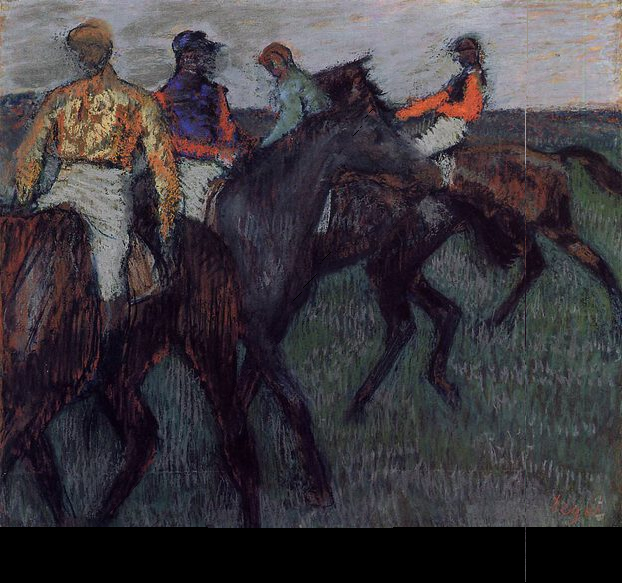

In [21]:
seam_carving(edgar_img, 680, 525)

Seam carving may not work well with art do to little amount of background activity in some paintings. 

Let's check out normal resizing of these images and see how effective this is.

##### Normal Padding

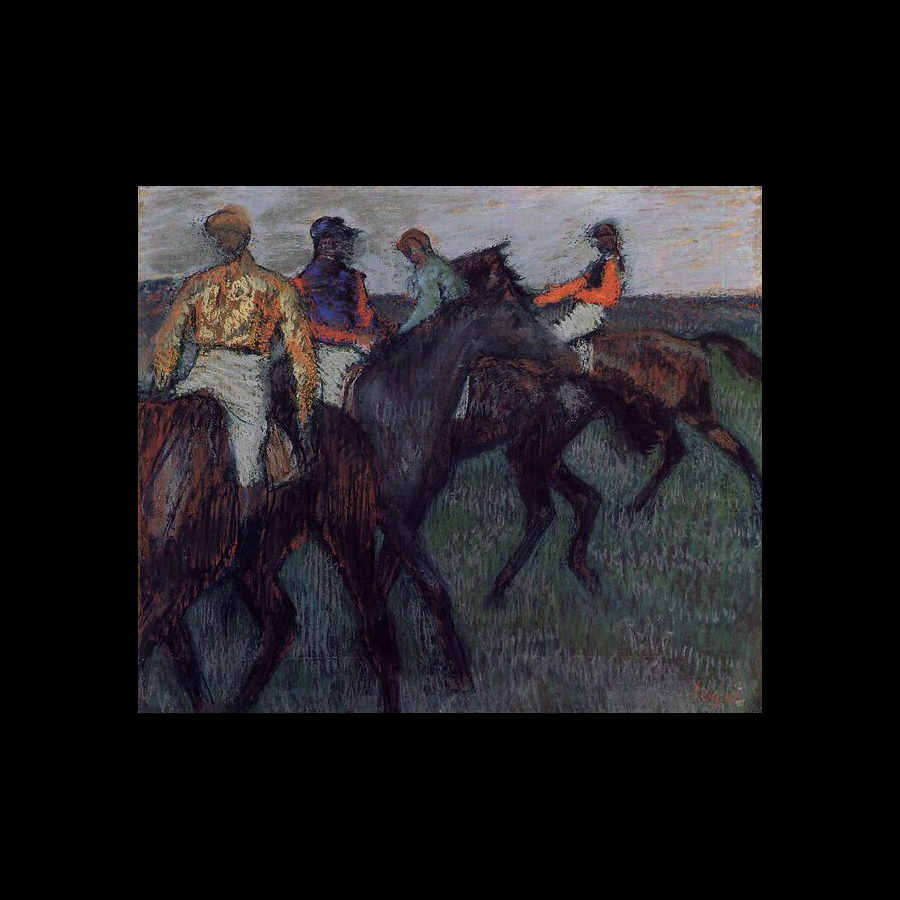

In [22]:
normal_padding(edgar_img, 900, 900)

##### Randomized Padding

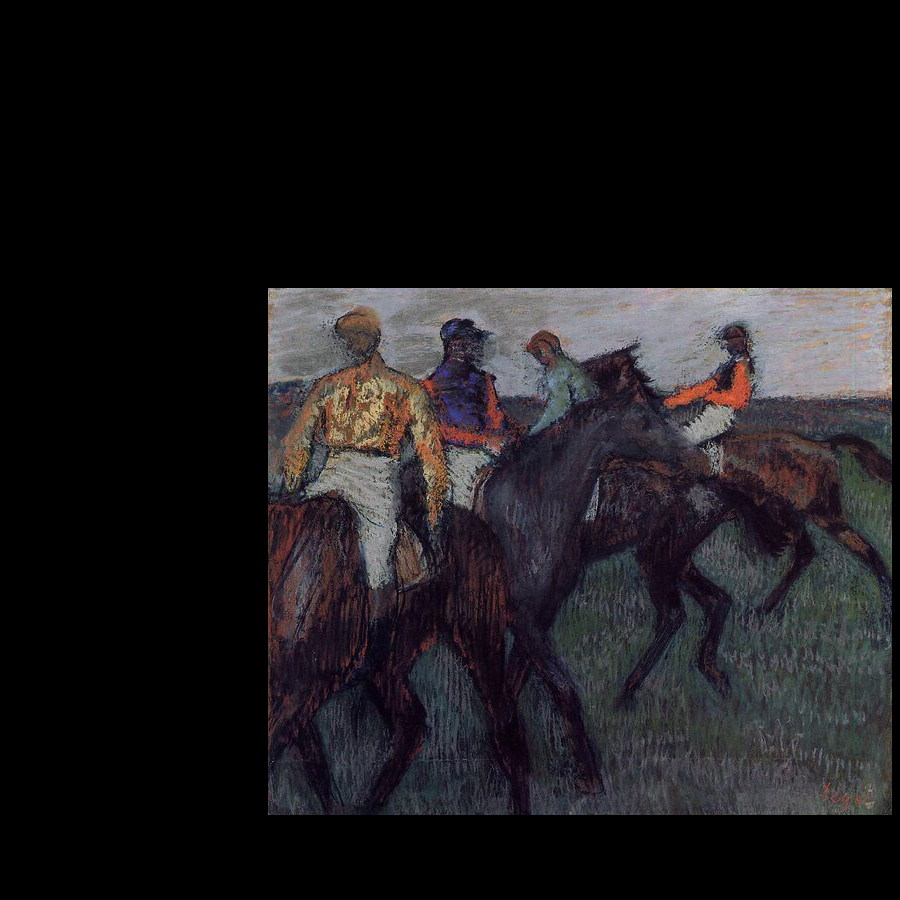

In [23]:
randomized_padding(edgar_img, 900, 900)

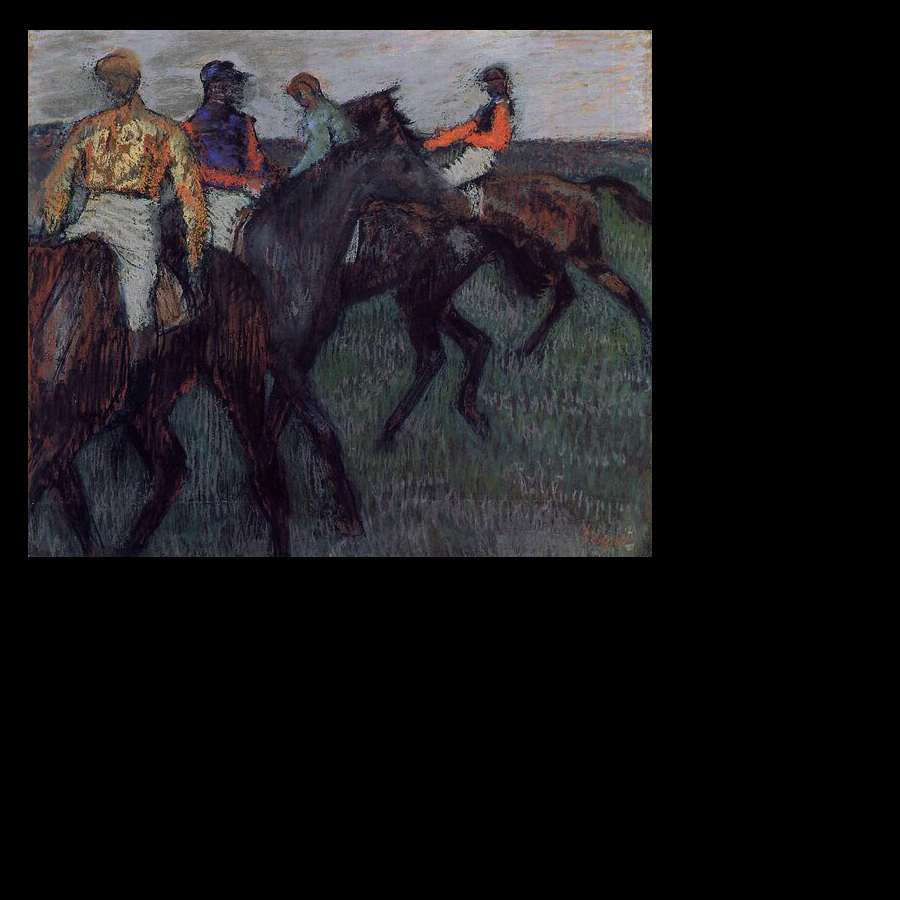

In [24]:
randomized_padding(edgar_img, 900, 900)

##### Basic Image Resampling

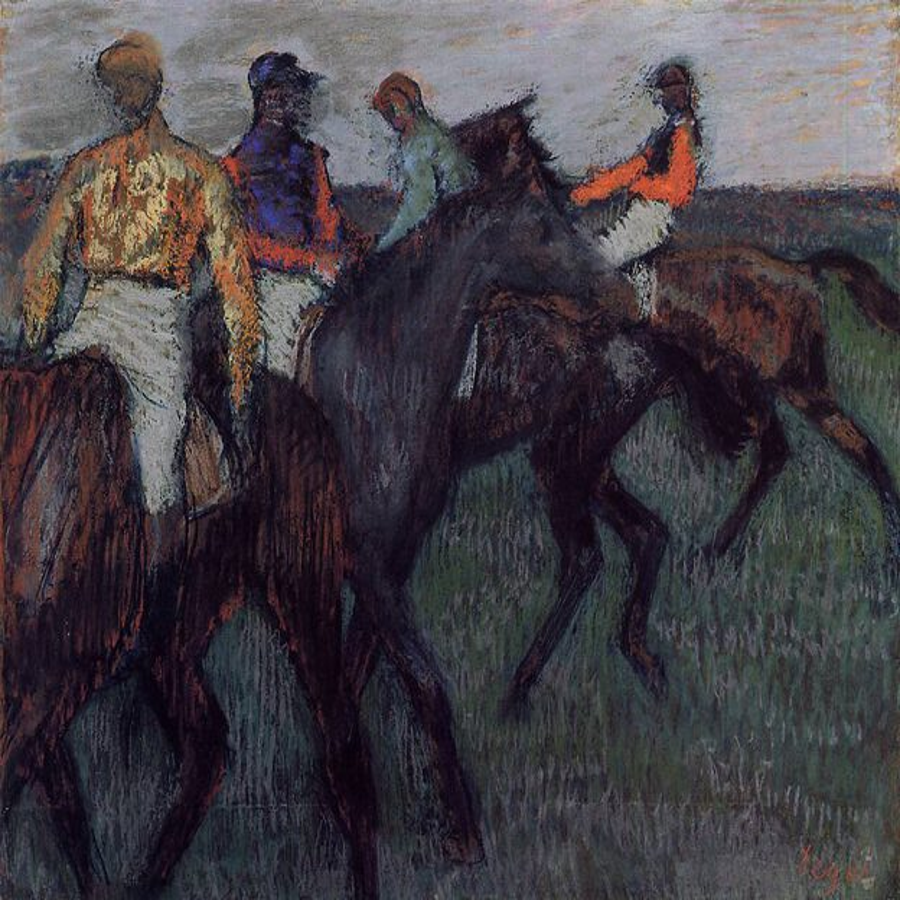

In [37]:
image_resampling(edgar_img, 900, 900)

This looks really good, at first glance there appears to be no data loss. Also the algorithm was extremely fast.

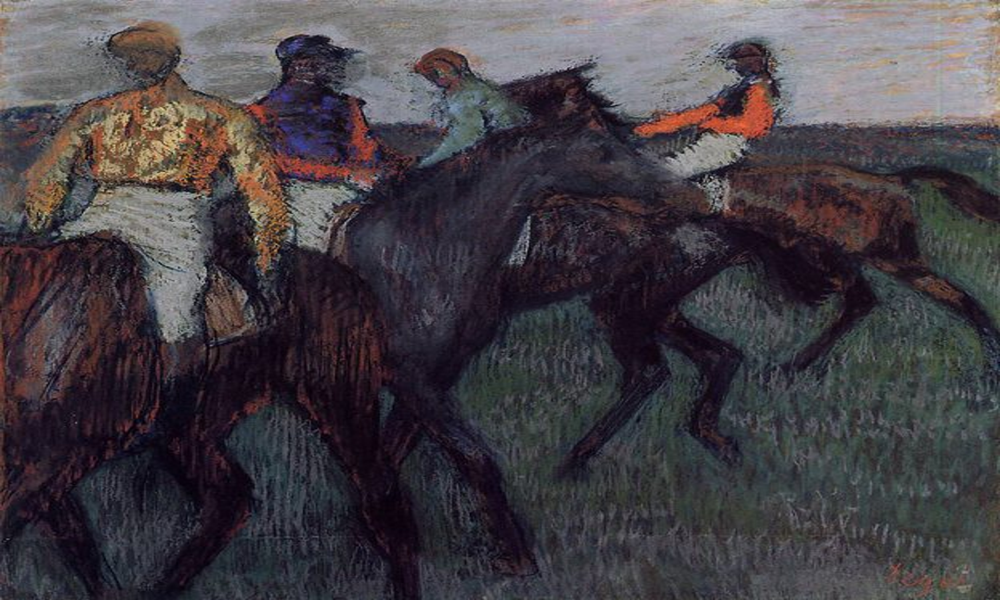

In [38]:
image_resampling(edgar_img, 1500, 900)

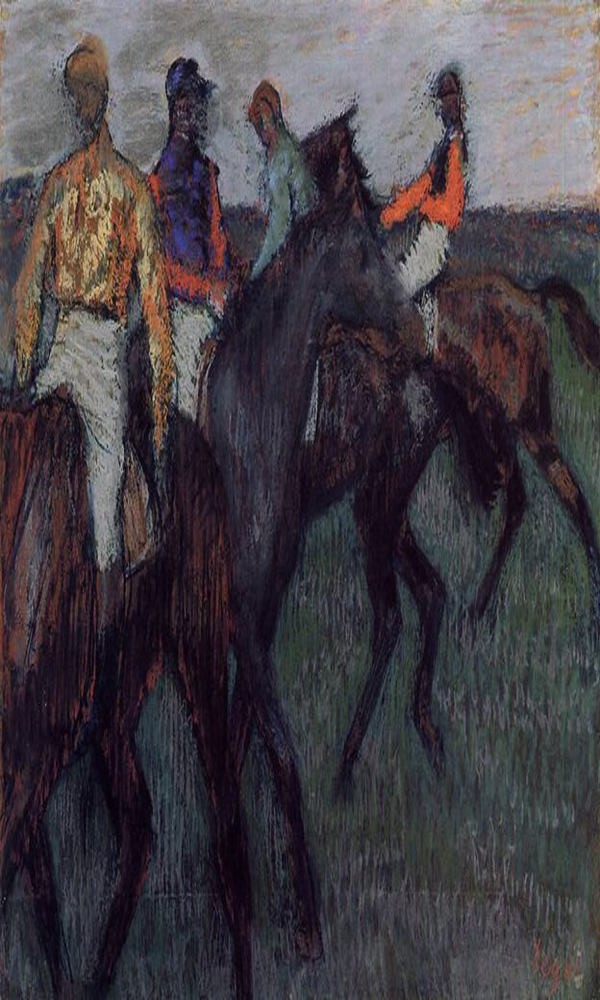

In [39]:
image_resampling(edgar_img, 900, 1500)

Due to the speed of this resizing technique I don't think we are going to get a better algorithm. We will use this instead.

##### OpenCV Version

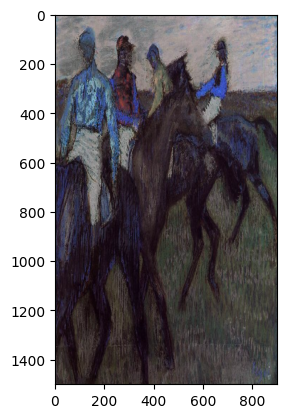

In [41]:
import cv2
edgar_img = cv2.imread(edgar_path)

plt.imshow(image_resampling_cv2(edgar_img, 900, 1500)) # Only looks different because jupyter has trouble displaying cv2 images so we have to use matplotlib.